In [24]:
import random
from typing import Optional, Tuple

import matplotlib.pyplot as plt
import numpy as np
import torch
from moviepy.editor import ImageSequenceClip

from src import camera, scene_generation

## Config

In [25]:
# Set seeds for reproducibility
seed = 17
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

# Ensure deterministic behavior with CuDNN
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

torch.autograd.set_detect_anomaly(True)

In [26]:
# Config parameters

# Scene parameters
center = scene_generation.CENTER
world_size = scene_generation.WORLD_SIZE
inf_depth = scene_generation.INFINITE_DEPTH

# Camera parameters
focal_length = 30  # Focal length in world units
picture_fov = 50  # "Lengt" of the focal plane (in world units)
picture_size = 200  # Number of pixels of the 1D picture
radius = 150 # Radius of the circle of cameras
number_of_pictures = 50  # Number of pictures to take

# NERF parameters
near_thresh = 20
far_thresh = 600
depth_samples_per_ray = 64

# Learning parameters

# Chunksize (Note: this isn't batch size in the conventional sense. This only
# specifies the number of rays to be queried in one go. Backprop still happens
# only after all rays from the current "bundle" are queried and rendered).
chunksize = 16384 // 2 # Adjust chunksize based on your GPU memory.
batchsize = 500 # number of rays to be considered at each backprop iteration (when not randomizing rays)
lr = 5e-3
num_iters = 50_000
display_every = 1000  # Number of iters after which stats are displayed

## Scene generation

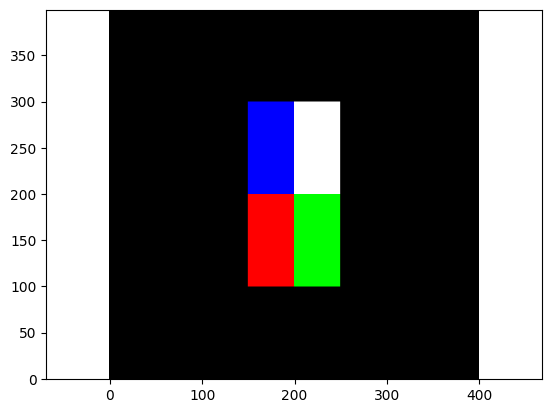

In [27]:
# scene = scene_generation.generate_random_scene()
# scene = scene_generation.generate_gradient_scene()
scene = scene_generation.generate_deterministic_scene()
plt.imshow(scene, origin="lower")
plt.axis('equal')
plt.show()

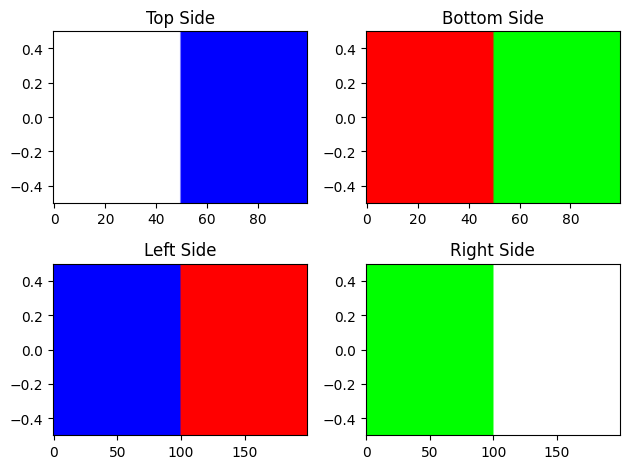

In [28]:
# Plot the 4 sides of the rectangle
top_side = scene[299, 150:250]
bottom_side = scene[100, 150:250]
left_side = scene[100:300, 150]
right_side = scene[100:300, 249]

plt.subplot(2, 2, 1)
plt.imshow(np.flip(top_side, axis=0).reshape(1, 100, 3), aspect="auto", origin="lower")
plt.title("Top Side")

plt.subplot(2, 2, 2)
plt.imshow(bottom_side.reshape(1, 100, 3), aspect="auto", origin="lower")
plt.title("Bottom Side")

plt.subplot(2, 2, 3)
plt.imshow(np.flip(left_side, axis=0).reshape(1, 200, 3), aspect="auto", origin="lower")
plt.title("Left Side")

plt.subplot(2, 2, 4)
plt.imshow(right_side.reshape(1, 200, 3), aspect="auto", origin="lower")
plt.title("Right Side")

plt.tight_layout()
plt.show()

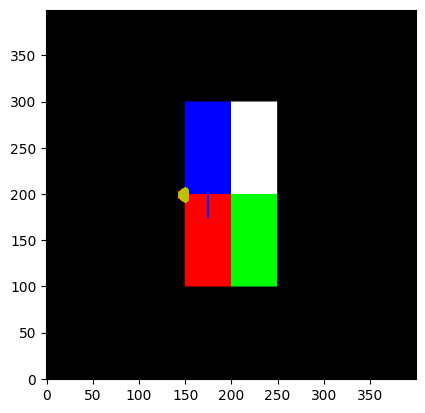

World coordinates of pixel 499: [175.          99.62311558   1.        ]


Text(0.5, 1.0, 'Depth map from viewpoint (145, 200)')

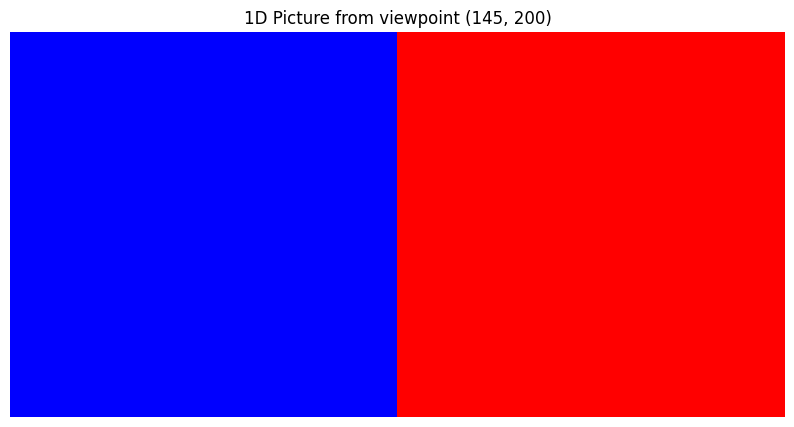

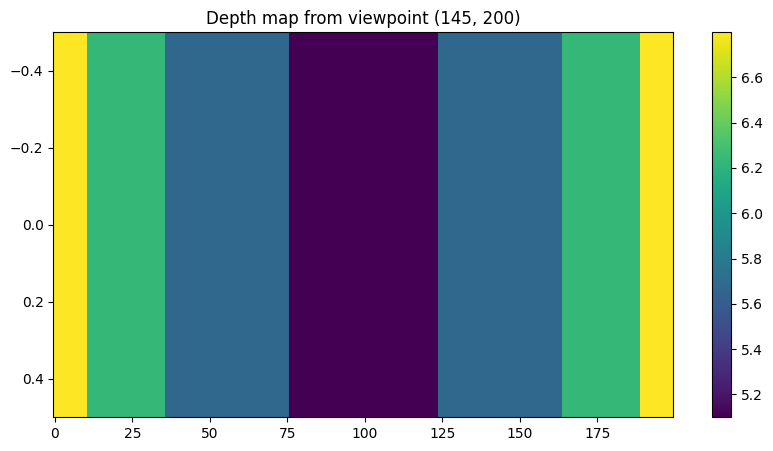

In [29]:
# Take a 1D photo of the scene
viewpoint = (145, 200)  # Example camera center
picture, image_plane_points_x, image_plane_points_y, tform_cam2world, depth_map = camera.take_1d_picture(scene, center, viewpoint, focal_length, picture_size, picture_fov, debug=True)

# Visualize the 1D picture
plt.figure(figsize=(10, 5))
plt.imshow(picture.reshape(1, -1, 3), aspect='auto')
plt.axis('off')
plt.title(f'1D Picture from viewpoint {viewpoint}')

# Print world coordinates of pixel px
px = 499
x_img = np.array([px / (picture_size - 1) * picture_fov - picture_fov / 2, focal_length, 1])
# Transform camera coordinates to world coordinates
world_point = tform_cam2world @ x_img
print(f"World coordinates of pixel {px}: {world_point}")

# Visualize the depth map
plt.figure(figsize=(10, 5))
plt.imshow(depth_map.reshape(1, -1), aspect='auto')
plt.colorbar()
plt.title(f"Depth map from viewpoint {viewpoint}")

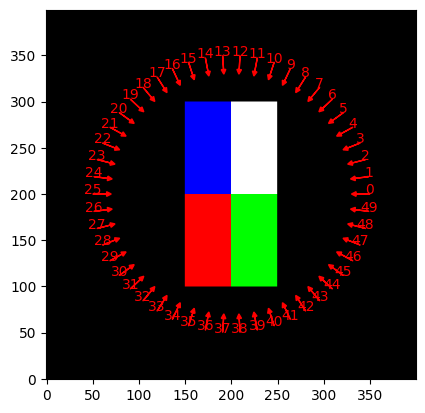

In [30]:
# Draw a circle around the rectangle and take pictures from each point
theta = np.linspace(0, 2 * np.pi - (2* np.pi / number_of_pictures), number_of_pictures)
viewpoints_x = 200 + radius * np.cos(theta)
viewpoints_y = 200 + radius * np.sin(theta)
images = []
depth_maps = []
tform_cam2worlds = []

plt.imshow(scene, origin="lower")

arrow_number = 0
for v_x, v_y in zip(viewpoints_x, viewpoints_y):
    image, _, _, tform_cam2world, depth_map = camera.take_1d_picture(scene, center, (v_x, v_y), focal_length, picture_size, picture_fov)
    images.append(image)
    depth_maps.append(depth_map)
    tform_cam2worlds.append(tform_cam2world)
    # Plot the arrows with the arrow number near to the arrow
    plt.arrow(v_x, v_y, (200 - v_x) / 10, (200 - v_y) / 10, head_width=5, head_length=5, fc='red', ec='red')
    plt.annotate(str(arrow_number), (v_x, v_y), textcoords="offset points", xytext=(0, 0), ha='center', color="red")
    arrow_number += 1

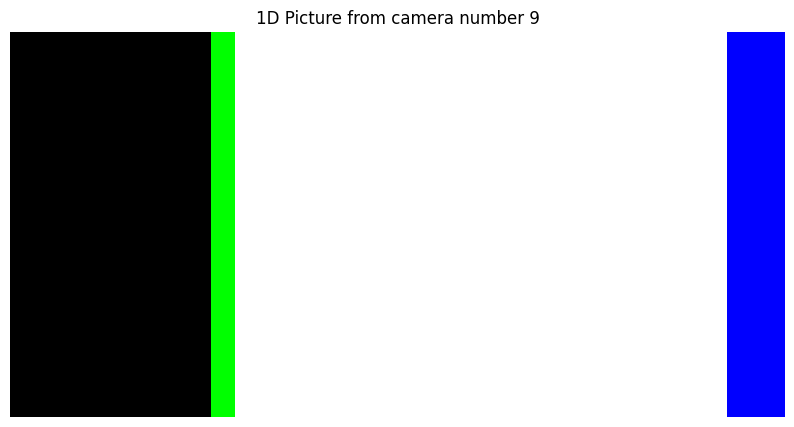

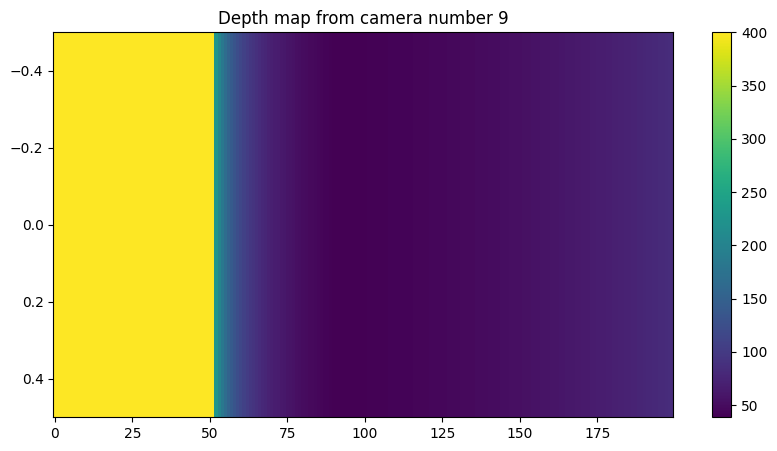

In [31]:
i = 9

plt.figure(figsize=(10, 5))
plt.imshow(images[i].reshape(1, -1, 3), aspect='auto')
plt.axis('off')
plt.title(f'1D Picture from camera number {i}')
plt.show()

# Visualize the depth map
plt.figure(figsize=(10, 5))
plt.imshow(depth_maps[i].reshape(1, -1), aspect='auto')
plt.colorbar()
plt.title(f"Depth map from camera number {i}")
plt.show()

## NERF functions

In [32]:
def get_ray_bundle_2d(picture_size: int, picture_fov: int, focal_length: float, tform_cam2world: np.ndarray):
    # Generate pixel coordinates for the 1D picture
    t_values = torch.linspace(-picture_fov / 2, picture_fov / 2, picture_size)

    # Normalize pixel coordinates
    directions = torch.stack([t_values / focal_length, torch.ones_like(t_values)], dim=-1)

    # Rotate and translate to world coordinates
    rotation_matrix = tform_cam2world[:2, :2]
    translation_vector = tform_cam2world[:2, 2]

    ray_directions = torch.matmul(directions, rotation_matrix.T)
    ray_origins = torch.tile(translation_vector, (picture_size, 1))

    return ray_origins, ray_directions

In [33]:
def compute_query_points_from_rays_2d(
    ray_origins: torch.Tensor,
    ray_directions: torch.Tensor,
    near_thresh: float,
    far_thresh: float,
    num_samples: int,
    randomize: Optional[bool] = True
) -> Tuple[torch.Tensor, torch.Tensor]:
    r"""Compute query 2D points given the "bundle" of rays. The near_thresh and far_thresh
    variables indicate the bounds within which 2D points are to be sampled.

    Args:
      ray_origins (torch.Tensor): Origin of each ray in the "bundle" as returned by the
        `get_ray_bundle()` method (shape: :math:`(picture_size, 2)`).
      ray_directions (torch.Tensor): Direction of each ray in the "bundle" as returned by the
        `get_ray_bundle()` method (shape: :math:`(picture_size, 2)`).
      near_thresh (float): The 'near' extent of the bounding volume (i.e., the nearest depth
        coordinate that is of interest/relevance).
      far_thresh (float): The 'far' extent of the bounding volume (i.e., the farthest depth
        coordinate that is of interest/relevance).
      num_samples (int): Number of samples to be drawn along each ray. Samples are drawn
        randomly, whilst trying to ensure "some form of" uniform spacing among them.
      randomize (optional, bool): Whether or not to randomize the sampling of query points.
        By default, this is set to `True`. If disabled (by setting to `False`), we sample
        uniformly spaced points along each ray in the "bundle".

    Returns:
      query_points (torch.Tensor): Query points along each ray
        (shape: :math:`(picture_size, num_samples, 2)`).
      depth_values (torch.Tensor): Sampled depth values along each ray
        (shape: :math:`(num_samples)`).
    """
    # Shape: (num_samples)
    depth_values = torch.linspace(near_thresh, far_thresh, num_samples).to(ray_origins)
    if randomize is True:
        # ray_origins: (picture_size, 2)
        # noise_shape = (picture_size, num_samples)
        noise_shape = list(ray_origins.shape[:-1]) + [num_samples]
        # depth_values: (num_samples)
        depth_values = depth_values + torch.rand(noise_shape).to(ray_origins) * (far_thresh - near_thresh) / num_samples

    # (picture_size, num_samples, 2) = (picture_size, 1, 2) + (picture_size, 1, 2) * (num_samples, 1)
    # query_points: (picture_size, num_samples, 2)
    query_points = ray_origins[..., None, :] + ray_directions[..., None, :] * depth_values[..., :, None]
    return query_points, depth_values

In [34]:
def render_volume_density_2d(
    radiance_field: torch.Tensor,
    ray_origins: torch.Tensor,
    depth_values: torch.Tensor,
    no_activation = False,
) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
    r"""Differentiably renders a radiance field, given the origin of each ray in the
    "bundle", and the sampled depth values along them.

    Args:
        radiance_field (torch.Tensor): A "field" where, at each query location (X, Y),
          we have an emitted (RGB) color and a volume density (denoted :math:`\sigma` in
          the paper) (shape: :math:`(picture_size, num_samples, 4)`).
        ray_origins (torch.Tensor): Origin of each ray in the "bundle" as returned by the
          `get_ray_bundle()` method (shape: :math:`(picture_size, 2)`).
        depth_values (torch.Tensor): Sampled depth values along each ray
          (shape: :math:`(num_samples)`).

    Returns:
        rgb_map (torch.Tensor): Rendered RGB image (shape: :math:`(picture_size, 3)`).
        depth_map (torch.Tensor): Rendered depth image (shape: :math:`(picture_size)`).
        acc_map (torch.Tensor): Accumulated transmittance map (shape: :math:`(picture_size)`).
    """
    # Compute alpha values
    sigma_a = torch.nn.functional.softplus(radiance_field[..., 3])
    rgb = torch.sigmoid(radiance_field[..., :3])
    if no_activation:
        rgb = radiance_field[..., :3]
        sigma_a = radiance_field[..., 3]
    # Large constant for the distance at the last sample point
    one_e_10 = torch.tensor([1e10], dtype=ray_origins.dtype, device=ray_origins.device)
    # Compute distances between adjacent depth values
    dists = torch.cat((depth_values[..., 1:] - depth_values[..., :-1], one_e_10.expand(depth_values[..., :1].shape)), dim=-1)
    # Compute alpha values
    alpha = 1. - torch.exp(-sigma_a * dists)
    # Compute weights
    weights = alpha * cumprod_exclusive(1. - alpha + 1e-10)
    # Compute rendered RGB map
    rgb_map = (weights[..., None] * rgb).sum(dim=-2)
    # Compute rendered depth map
    depth_map = (weights * depth_values).sum(dim=-1)
    # Compute accumulated transmittance map
    acc_map = weights.sum(-1)
    return rgb_map, depth_map, acc_map


def cumprod_exclusive(tensor):
    r"""
    Compute exclusive cumulative product of the input tensor along the last dimension.
    """
    # Compute the cumulative product along the last dimension and prepend 1 along the last dimension
    cumprod = torch.cumprod(tensor, dim=-1)
    cumprod = torch.cat([torch.ones_like(cumprod[..., :1]), cumprod[..., :-1]], dim=-1)
    return cumprod

In [35]:
def positional_encoding(
    tensor, num_encoding_functions=6, include_input=True, log_sampling=True
) -> torch.Tensor:
  r"""Apply positional encoding to the input.

  Args:
    tensor (torch.Tensor): Input tensor to be positionally encoded.
    num_encoding_functions (optional, int): Number of encoding functions used to
        compute a positional encoding (default: 6).
    include_input (optional, bool): Whaether or not to include the input in the
        computed positional encoding (default: True).
    log_sampling (optional, bool): Sample logarithmically in frequency space, as
        opposed to linearly (default: True).

  Returns:
    (torch.Tensor): Positional encoding of the input tensor.
  """
  # Trivially, the input tensor is added to the positional encoding.
  encoding = [tensor] if include_input else []
  # Now, encode the input using a set of high-frequency functions and append the
  # resulting values to the encoding.
  frequency_bands = None
  if log_sampling:
      frequency_bands = 2.0 ** torch.linspace(
            0.0,
            num_encoding_functions - 1,
            num_encoding_functions,
            dtype=tensor.dtype,
            device=tensor.device,
        )
  else:
      frequency_bands = torch.linspace(
          2.0 ** 0.0,
          2.0 ** (num_encoding_functions - 1),
          num_encoding_functions,
          dtype=tensor.dtype,
          device=tensor.device,
      )

  for freq in frequency_bands:
      for func in [torch.sin, torch.cos]:
          encoding.append(func(tensor * freq))
  # Special case, for no positional encoding
  if len(encoding) == 1:
      return encoding[0]
  else:
      return torch.cat(encoding, dim=-1)

In [36]:
class VeryTinyNerfModel2D(torch.nn.Module):
    r"""Define a "very tiny" NeRF model comprising three fully connected layers for 2D inputs.
    """
    def __init__(self, filter_size=128, num_encoding_functions=6):
        super(VeryTinyNerfModel2D, self).__init__()
        # Input layer: input dimension is 2 for 2D coordinates
        self.layer1 = torch.nn.Linear(2 + 2 * 2 * num_encoding_functions, filter_size)
        # Layer 2
        self.layer2 = torch.nn.Linear(filter_size, filter_size)
        # Layer 3: output 4 dimensions (RGB + density)
        self.layer3 = torch.nn.Linear(filter_size, 4)
        # Activation function
        self.relu = torch.nn.functional.relu

    def forward(self, x):
        x = self.relu(self.layer1(x))
        x = self.relu(self.layer2(x))
        x = self.layer3(x)
        return x

In [37]:
def run_one_iter_of_tinynerf_2d(world_size, img_size, picture_fov, focal_length, tform_cam2world,
                                near_thresh, far_thresh, depth_samples_per_ray,
                                get_minibatches_function, model, chunksize=1024, debug_rendering=False):
    # Get the "bundle" of rays through all image pixels.
    ray_origins, ray_directions = get_ray_bundle_2d(img_size, picture_fov, focal_length, tform_cam2world)

    # Sample query points along each ray
    query_points, depth_values = compute_query_points_from_rays_2d(
        ray_origins, ray_directions, near_thresh, far_thresh, depth_samples_per_ray
    )

    # "Flatten" the query points.
    flattened_query_points = query_points.reshape((-1, 2))

    # Normalize the query points to the range [-1, 1]
    flattened_query_points = (flattened_query_points / world_size) * 2.0 - 1.0

    # Encode the query points
    encoded_query_points = positional_encoding(flattened_query_points)

    # Split the query points into "chunks", run the model on all chunks, and concatenate the results
    batches = get_minibatches_function(encoded_query_points, chunksize=chunksize)
    predictions = []
    for batch in batches:
        predictions.append(model(batch))
    radiance_field_flattened = torch.cat(predictions, dim=0)

    # "Unflatten" to obtain the radiance field.
    unflattened_shape = list(query_points.shape[:-1]) + [4]
    radiance_field = torch.reshape(radiance_field_flattened, unflattened_shape)

    # Debug rendering is used only to debug the rendering part, because the radiance field
    # is always perfect based on the original 2D scene. When there's an object density =1 and RGB=scene RGB
    if debug_rendering:
        for i in range(query_points.shape[0]):
            for j in range(query_points.shape[1]):
                x,y = int(query_points[i, j, 0]), int(query_points[i, j, 1])
                if 0<= x <= 399 and 0 <= y <= 399 and np.sum(scene[y, x]) != 0:
                    radiance_field[i,j,:3] = torch.tensor(scene[y, x])
                    radiance_field[i,j,3] = 1
                else:
                    radiance_field[i,j,:3] = torch.tensor([0, 0, 0])
                    radiance_field[i,j,3] = 0

    # Perform differentiable volume rendering to re-synthesize the RGB image.
    rgb_predicted, depth_predicted, _ = render_volume_density_2d(radiance_field, ray_origins, depth_values, debug_rendering)

    # TODO: validate this assumption is correct
    # points with exactly 0 depth are because the density is 0 meaning that the depth is infinite
    depth_predicted[depth_predicted == 0] = inf_depth

    return rgb_predicted, depth_predicted

In [38]:
def get_minibatches(inputs: torch.Tensor, chunksize: Optional[int] = 1024 * 8):
  r"""Takes a huge tensor (ray "bundle") and splits it into a list of minibatches.
  Each element of the list (except possibly the last) has dimension `0` of length
  `chunksize`.
  """
  return [inputs[i:i + chunksize] for i in range(0, inputs.shape[0], chunksize)]

## Training loop

In [39]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

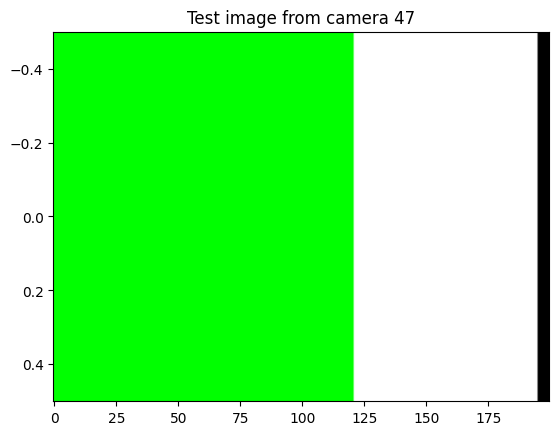

In [40]:
# Backup images for debug
debug_images = images.copy()
debug_tfrom_cam2worlds = tform_cam2worlds.copy()

# Images and matrices to numpy
images = np.array(images)
depth_maps = np.array(depth_maps)
tform_cam2worlds = np.array(tform_cam2worlds)

# Hold one image for test
test_index = np.random.randint(0, len(images))
testimg, testpose, testdepth = images[test_index], tform_cam2worlds[test_index], depth_maps[test_index]
images = np.delete(images, test_index, axis=0)
tform_cam2worlds = np.delete(tform_cam2worlds, test_index, axis=0)
depth_maps = np.delete(depth_maps, test_index, axis=0)

# Send everything to device
testimg = torch.from_numpy(testimg).to(device)
testpose = torch.from_numpy(testpose).to(device)
testdepth = torch.from_numpy(testdepth).to(device)
images = torch.from_numpy(images).to(device)
depth_maps = torch.from_numpy(depth_maps).to(device)
tform_cam2worlds = torch.from_numpy(tform_cam2worlds).to(device)
focal_length = torch.from_numpy(np.array(focal_length)).to(device)


# Plot test holdout image
plt.imshow(testimg.detach().cpu().numpy().reshape(1, -1, 3), aspect="auto")
plt.title(f"Test image from camera {test_index}")
plt.show()

Loss: 0.23789510130882263


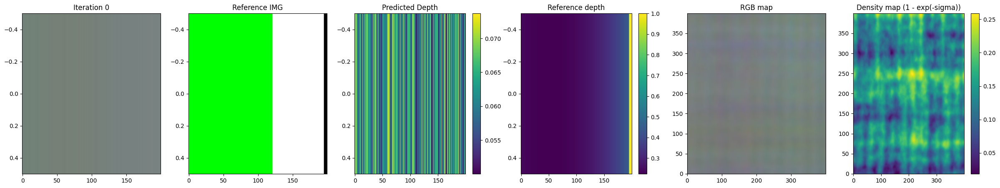

Loss: 0.01068868488073349


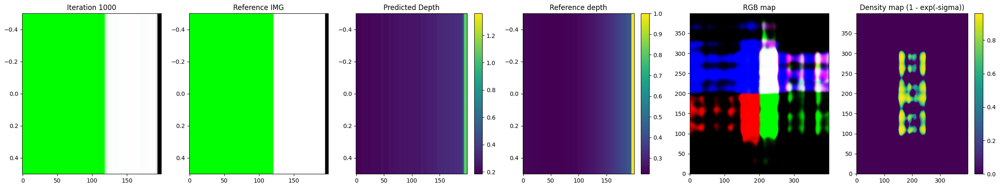

Loss: 0.006072436925023794


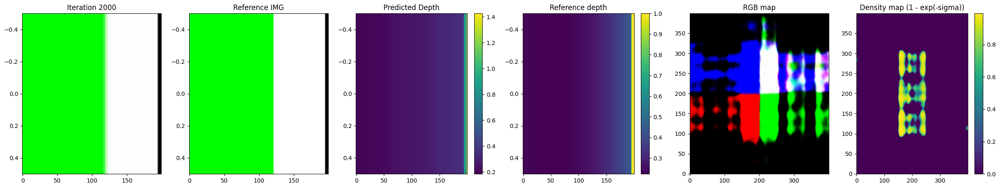

Loss: 0.005693321581929922


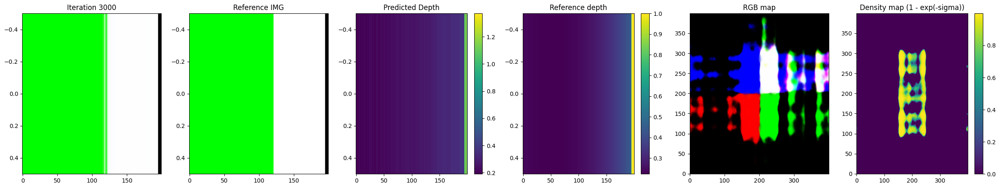

Loss: 0.005417397245764732


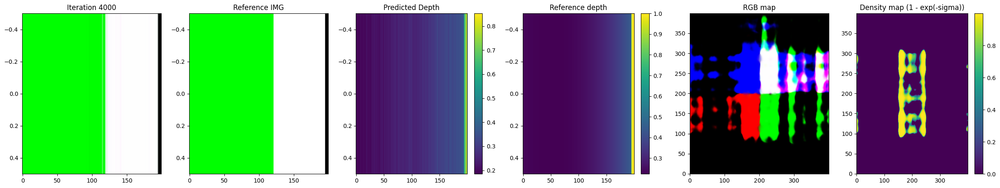

Loss: 0.004580316599458456


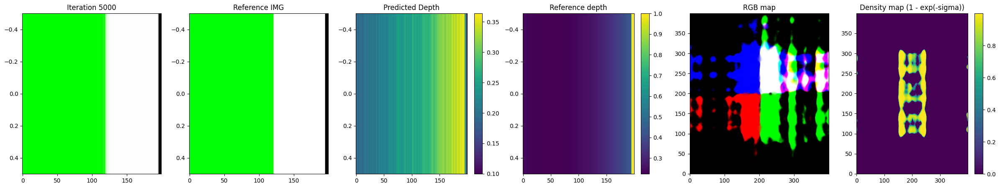

Loss: 0.008029559627175331


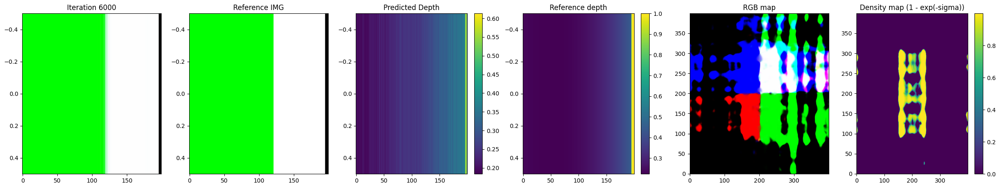

Loss: 0.0028760447166860104


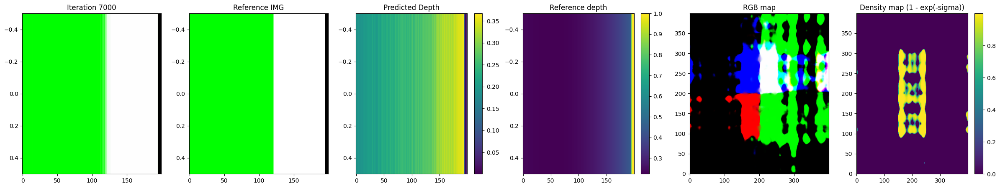

Loss: 0.006172569002956152


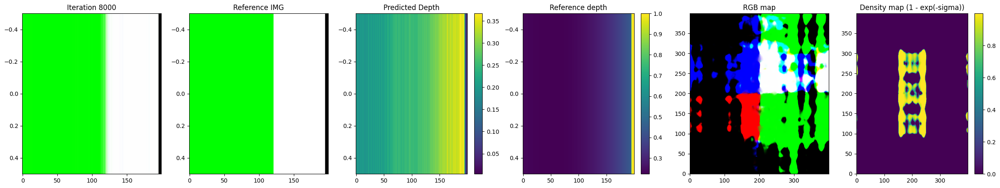

Loss: 0.0037129914853721857


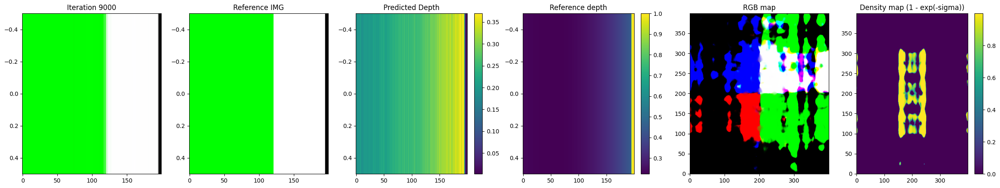

Loss: 0.004926430527120829


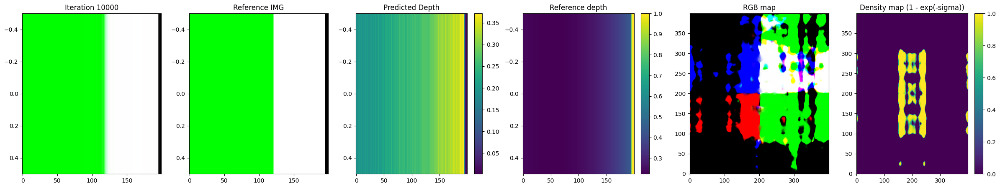

Loss: 0.005247609689831734


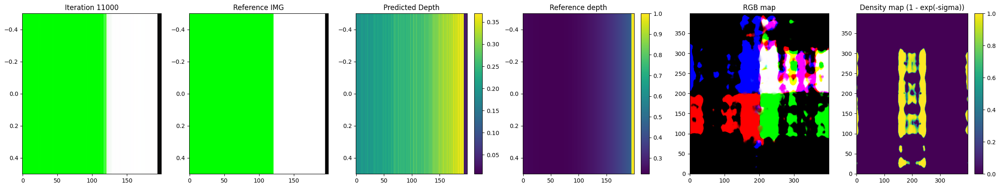

Loss: 0.004437589086592197


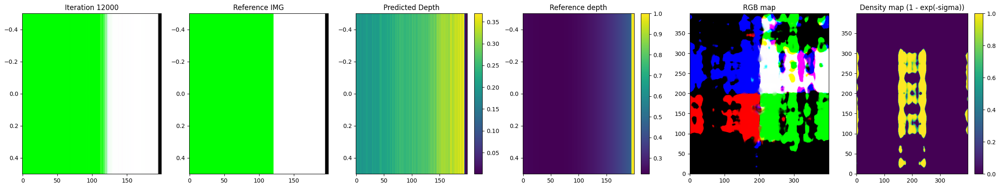

Loss: 0.0020320366602391005


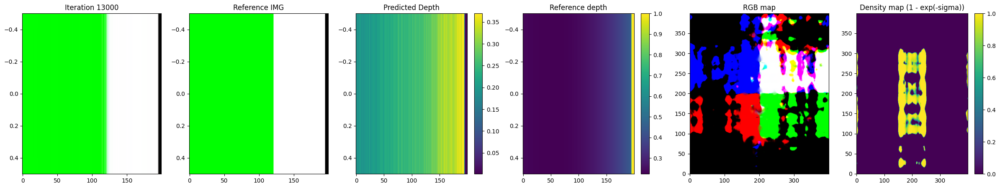

Loss: 0.00364223076030612


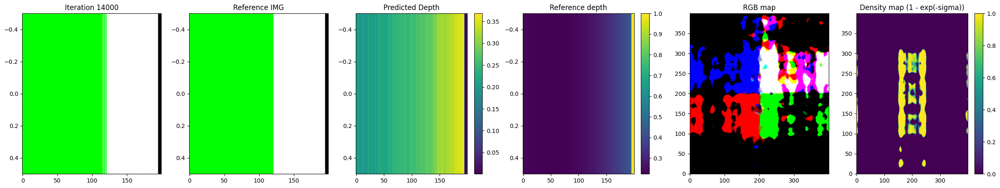

Loss: 0.0016349436482414603


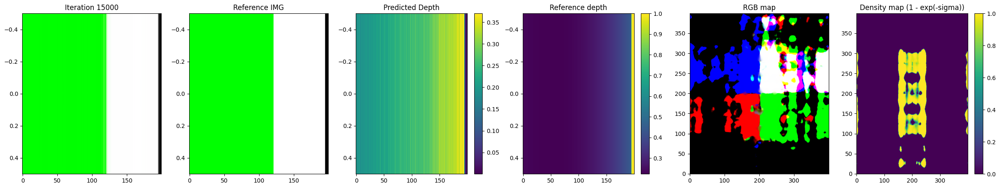

Loss: 0.004169792402535677


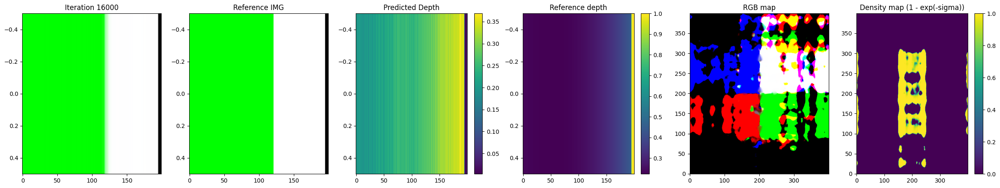

Loss: 0.0028024360071867704


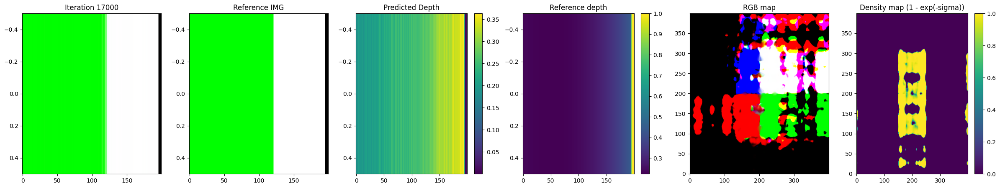

Loss: 0.0058525013737380505


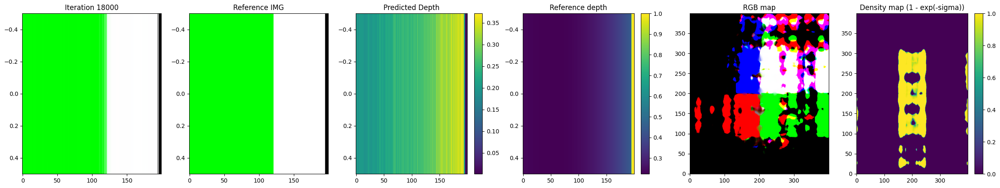

Loss: 0.0019636161159723997


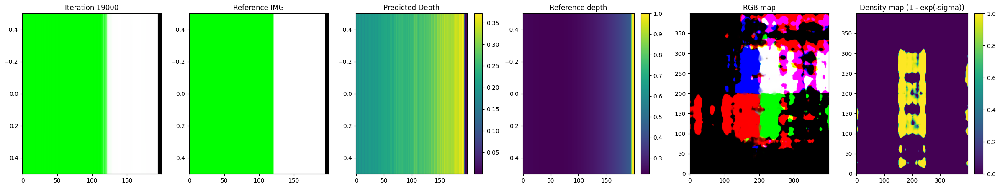

Loss: 0.0065338630229234695


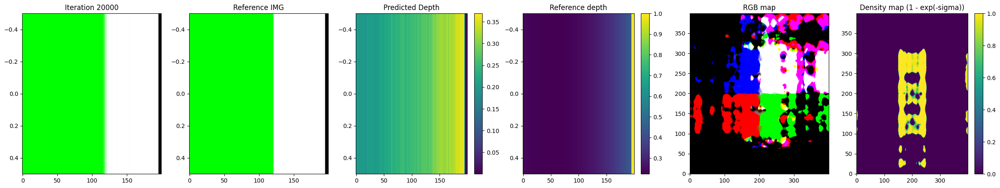

Loss: 0.009124470874667168


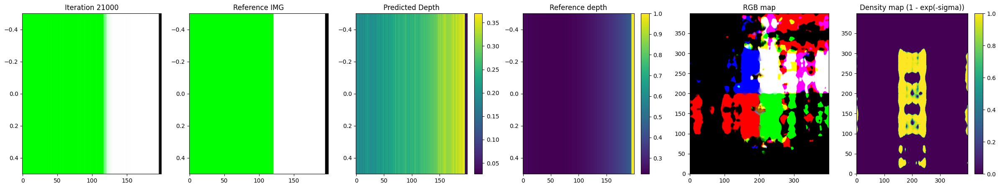

Loss: 0.006175713613629341


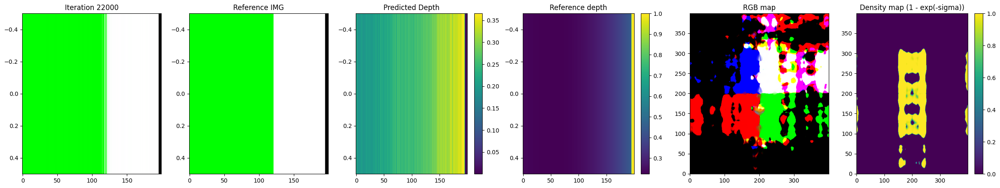

Loss: 0.0037510148249566555


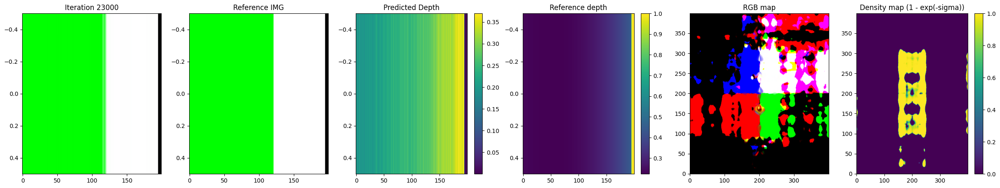

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Loss: 0.0014600495342165232


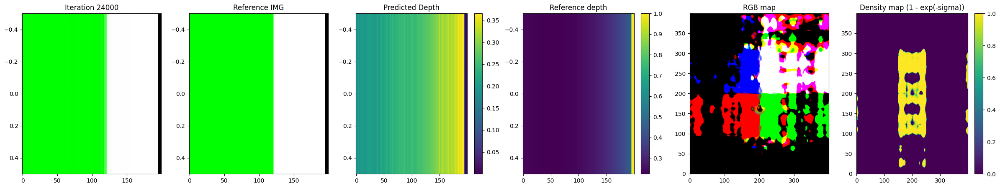

Loss: 0.0037588600534945726


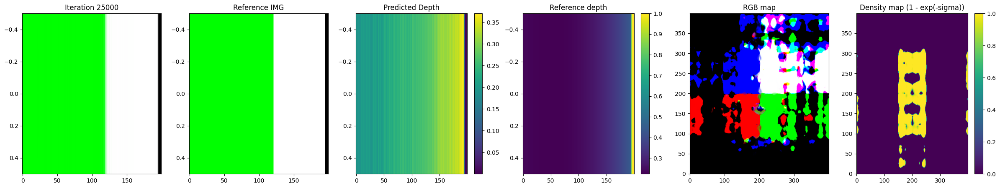

Loss: 0.0014557040994986892


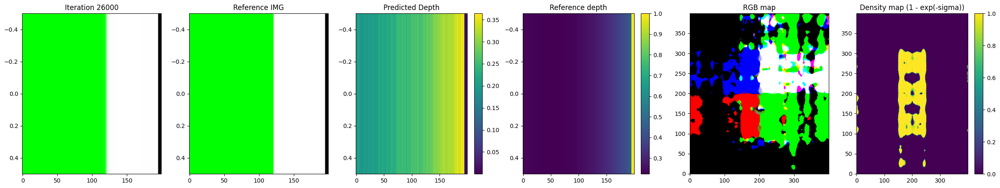

Loss: 0.005530199967324734


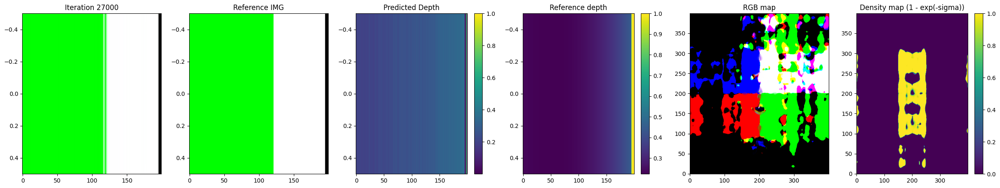

Loss: 0.007083701901137829


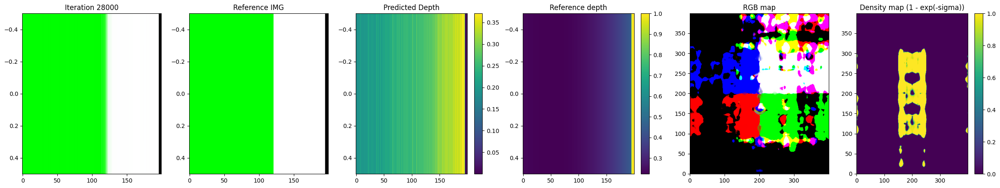

Loss: 0.003358253976330161


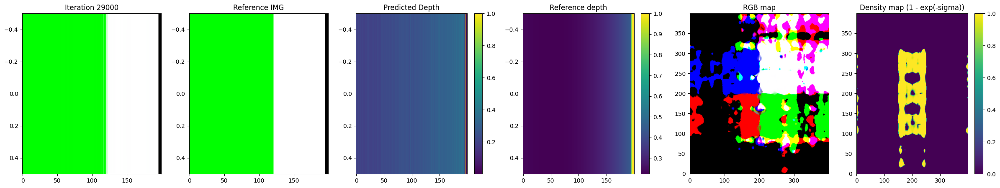

Loss: 0.005137252621352673


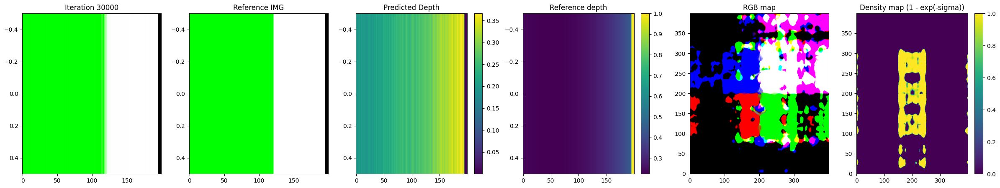

Loss: 0.0036971752997487783


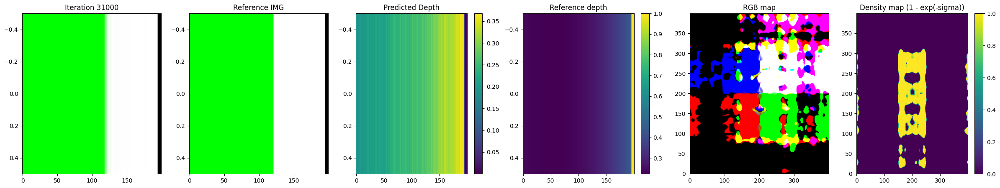

Loss: 0.006213421002030373


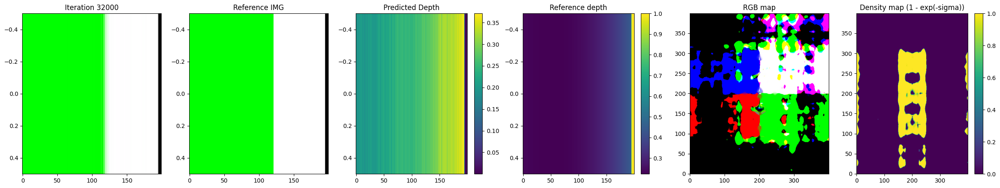

Loss: 0.005914200562983751


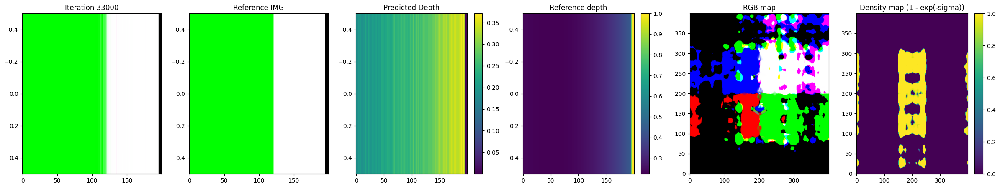

Loss: 0.008236309513449669


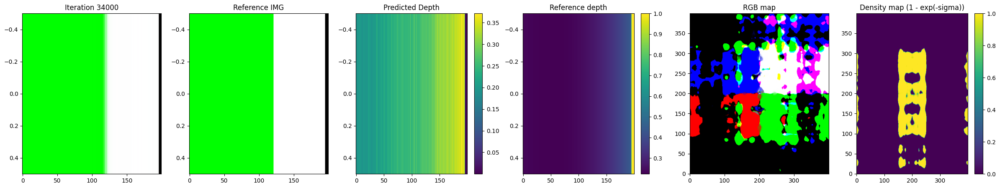

Loss: 0.007338403724133968


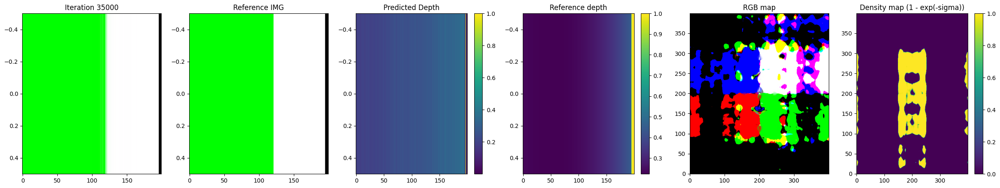

Loss: 0.007735613267868757


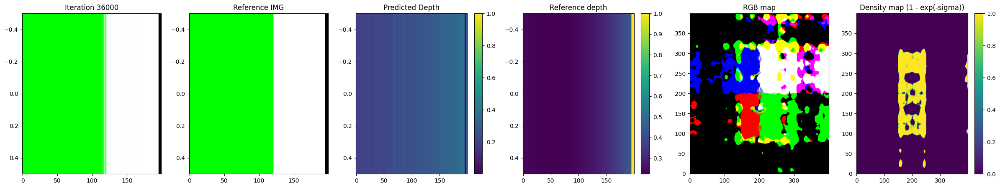

Loss: 0.003613994223996997


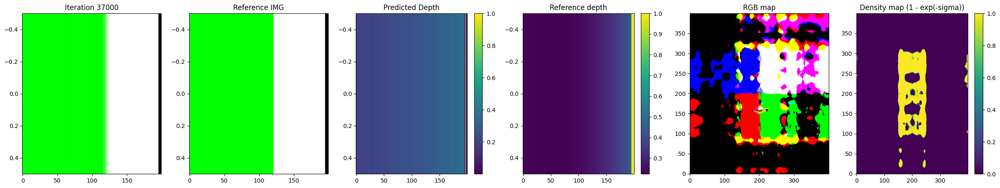

Loss: 0.0034617388155311346


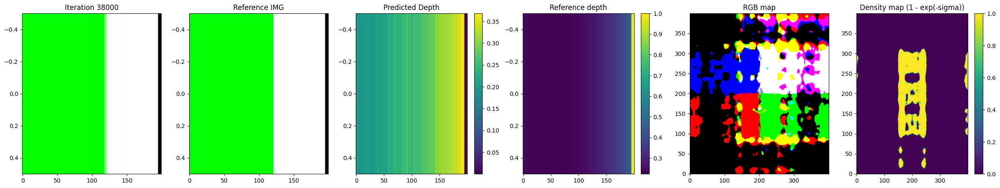

Loss: 0.006353352218866348


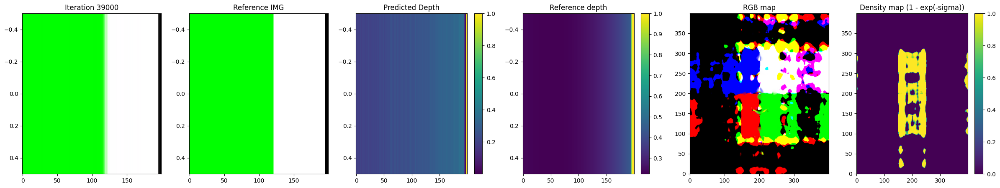

Loss: 0.0022601960226893425


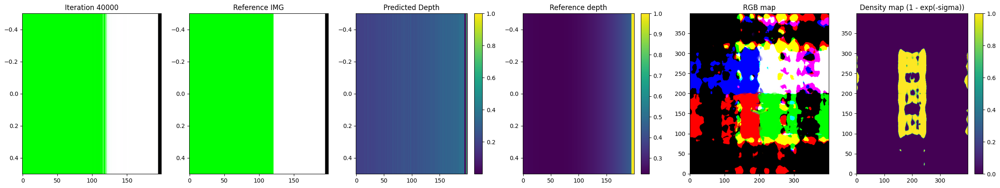

Loss: 0.00805648323148489


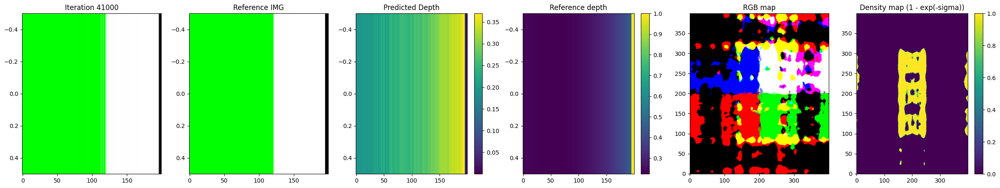

Loss: 0.003457571379840374


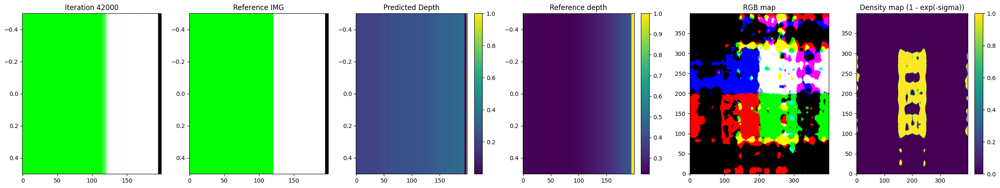

Loss: 0.0022656256332993507


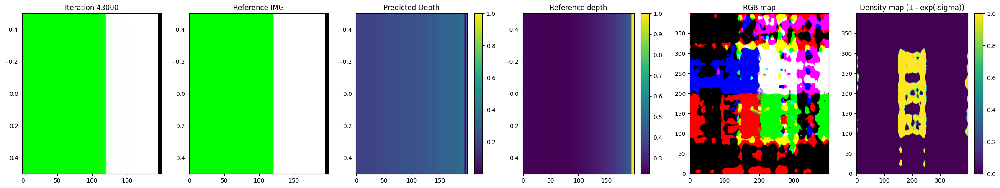

Loss: 0.0100624468177557


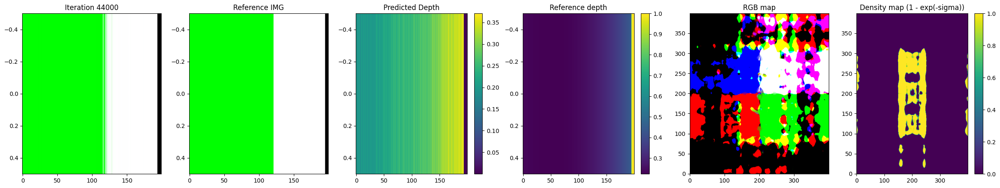

Loss: 0.0031310589984059334


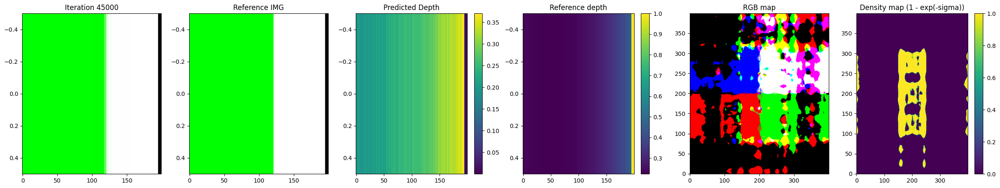

Loss: 0.0011136509710922837


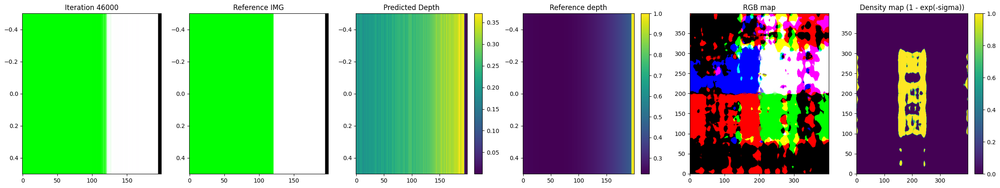

Loss: 0.011011641472578049


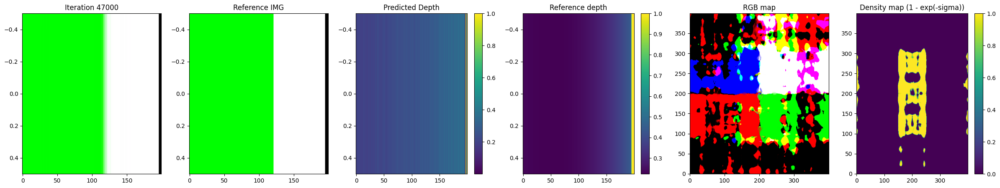

Loss: 0.009776514023542404


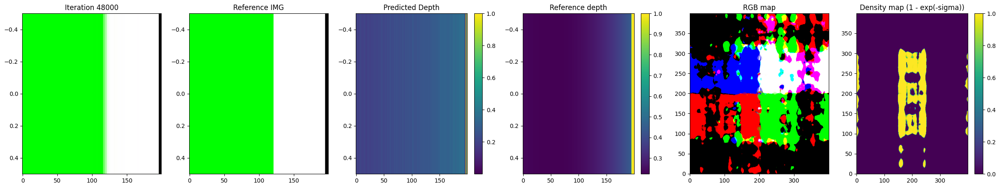

Loss: 0.004271315410733223


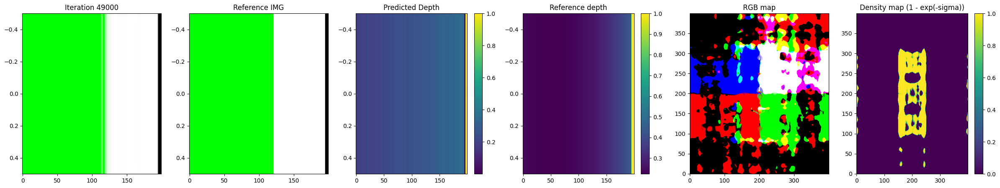

Done!


In [18]:
DEBUG_RENDERING = False
RANDOM_BATCHES = True
MONOCULAR_CUE = False

"""
Model
"""

model = VeryTinyNerfModel2D()
model.to(device)

"""
Optimizer
"""
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

"""
Train-Eval-Repeat!
"""
# Lists to log metrics etc.
losses = []
rgb_maps = []
densities = []

# Pre compute all rays and targets
rays = [get_ray_bundle_2d(picture_size, picture_fov, focal_length, tform_cam2world)  for tform_cam2world in tform_cam2worlds]
ray_origins, ray_directions = zip(*rays)
ray_origins = torch.stack(ray_origins, axis=0).view(-1, 2)
ray_directions = torch.stack(ray_directions, axis=0).view(-1, 2)
# Create a target list with the rgb value associated to each ray, each ray is associated to a pixel (from left to right, for all images)
targets = []
targets_depth = []
for i in range(len(images)):
    for j in range(picture_size):
        targets.append(images[i][j])
        targets_depth.append(depth_maps[i][j])
targets = torch.stack(targets)
targets_depth = torch.stack(targets_depth)

for i in range(num_iters):

    if RANDOM_BATCHES:
        # Create a random batch of rays and targets from multiple images
        batch_indices = np.random.choice(len(ray_origins), batchsize)
        ray_origins_batch = ray_origins[batch_indices]
        ray_directions_batch = ray_directions[batch_indices]
        target_rgb_batch = targets[batch_indices]
        target_depth_batch = targets_depth[batch_indices]
        # Render batch
        query_points_batch, depth_values_batch = compute_query_points_from_rays_2d(
            ray_origins_batch, ray_directions_batch, near_thresh, far_thresh, depth_samples_per_ray
        )
        # "Flatten" the query points.
        flattened_query_points_batch = query_points_batch.reshape((-1, 2))
        # Normalize the query points to the range [-1, 1]
        flattened_query_points_batch = (flattened_query_points_batch / world_size) * 2.0 - 1.0
        # Encode the query points
        encoded_query_points_batch = positional_encoding(flattened_query_points_batch)
        batches = get_minibatches(encoded_query_points_batch, chunksize=chunksize)
        # NERF
        predictions = []
        for batch in batches:
            predictions.append(model(batch))
        radiance_field_flattened = torch.cat(predictions, dim=0)
        unflattened_shape = list(query_points_batch.shape[:-1]) + [4]
        radiance_field = torch.reshape(radiance_field_flattened, unflattened_shape)
        rgb_predicted, depth_predicted, _ = render_volume_density_2d(radiance_field, ray_origins_batch, depth_values_batch)
        loss = torch.nn.functional.mse_loss(rgb_predicted, target_rgb_batch)
        if MONOCULAR_CUE:
            loss += 0.1 * torch.nn.functional.mse_loss(depth_predicted / inf_depth, target_depth_batch / inf_depth)
        losses.append(loss.item())
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

    else:
        # Randomly pick an image as the target.
        target_img_idx = np.random.randint(images.shape[0])
        target_img = images[target_img_idx].to(device)
        target_tform_cam2world = tform_cam2worlds[target_img_idx].to(device)

        # Run one iteration of TinyNeRF and get the rendered RGB image.
        rgb_predicted, depth_predicted = run_one_iter_of_tinynerf_2d(world_size, picture_size, picture_fov, focal_length,
                                                    target_tform_cam2world, near_thresh,
                                                    far_thresh, depth_samples_per_ray,
                                                    get_minibatches, model, chunksize, DEBUG_RENDERING)

        # Compute mean-squared error between the predicted and target images. Backprop!
        loss = torch.nn.functional.mse_loss(rgb_predicted, target_img)
        if MONOCULAR_CUE:
            loss += 0.1 * torch.nn.functional.mse_loss(depth_predicted / inf_depth, depth_maps[target_img_idx] / inf_depth)
        losses.append(loss.item())
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

    # Display images/plots/stats
    if i % display_every == 0:
        # Render the held-out view
        with torch.no_grad():
            rgb_predicted, depth_predicted = run_one_iter_of_tinynerf_2d(world_size, picture_size, picture_fov, focal_length,
                                                        testpose, near_thresh,
                                                        far_thresh, depth_samples_per_ray,
                                                        get_minibatches, model, chunksize, DEBUG_RENDERING)
            loss = torch.nn.functional.mse_loss(rgb_predicted, testimg)

            # Sample the density across all world points
            # Generate 2d coordinates for the scene
            x = torch.linspace(0, world_size - 1, world_size)
            y = torch.linspace(0, world_size - 1, world_size)
            x, y = torch.meshgrid(x, y)
            flattened_scene_points = torch.stack([x.flatten(), y.flatten()], dim=-1).to(device)
            flattened_scene_points = (flattened_scene_points / world_size) * 2.0 - 1.0
            encoded_scene_points = positional_encoding(flattened_scene_points)
            radiance_field_scene = model(encoded_scene_points)
            sigma = torch.nn.functional.relu(radiance_field_scene[..., 3])
            rgb = torch.sigmoid(radiance_field_scene[..., :3])

            rgb_map = np.transpose(rgb.detach().cpu().numpy().reshape(world_size, world_size, 3), (1, 0 ,2))
            density_map = np.transpose(sigma.detach().cpu().numpy().reshape(world_size, world_size))

            rgb_maps.append(rgb_map)
            densities.append(density_map)

            print("Loss:", loss.item())
            plt.figure(figsize=(30, 5))
            plt.subplot(161)
            plt.imshow(rgb_predicted.detach().cpu().numpy().reshape(1, -1, 3), aspect="auto")
            plt.title(f"Iteration {i}")
            plt.subplot(162)
            plt.imshow(testimg.detach().cpu().numpy().reshape(1, -1, 3), aspect="auto")
            plt.title("Reference IMG")
            plt.subplot(163)
            depth_predicted = depth_predicted.detach().cpu().numpy()
            plt.imshow(depth_predicted.reshape(1, -1) / inf_depth, aspect="auto")
            plt.colorbar()
            plt.title("Predicted Depth")
            plt.subplot(164)
            plt.imshow(testdepth.reshape(1, -1) / inf_depth, aspect="auto")
            plt.colorbar()
            plt.title("Reference depth")
            plt.subplot(165)
            plt.imshow(rgb_map, aspect="auto", origin="lower")
            plt.title("RGB map")
            plt.subplot(166)
            plt.imshow(1 - np.exp(-density_map), aspect="auto", origin="lower")
            plt.colorbar()
            plt.title("Density map (1 - exp(-sigma))")
            plt.show()

print('Done!')

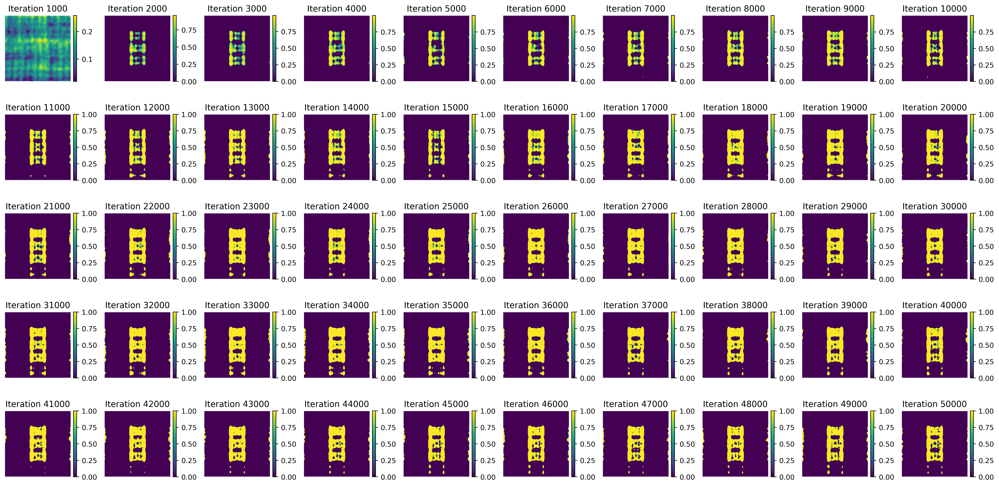

In [19]:
# Number of images
num_images = len(densities)

# Number of images per row
images_per_row = 10

# Calculate number of rows needed
num_rows = num_images // images_per_row + int(num_images % images_per_row != 0)

fig, axes = plt.subplots(num_rows, images_per_row, figsize=(20, 2 * num_rows), dpi=400)

for i, ax in enumerate(axes.flat):
    if i < num_images:
        img = ax.imshow(1 - np.exp(-densities[i]), cmap='viridis', origin='lower')
        ax.set_title(f"Iteration {1000 * (i+1)}")
        ax.axis('off')
        fig.colorbar(img, ax=ax, fraction=0.046, pad=0.04)  # Add color bar to each subplot
    else:
        ax.axis('off')

plt.tight_layout()
plt.show()

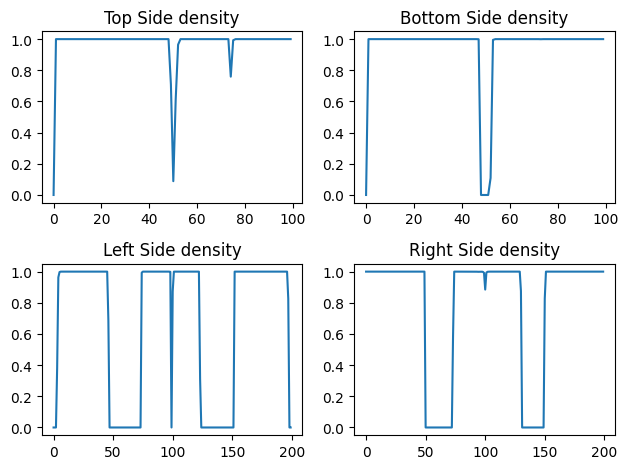

In [20]:
# Plot the 4 sides of the rectangle
final_density = 1 - np.exp(densities[-1])
top_side = 1 - np.exp(final_density[299, 150:250])
bottom_side = 1 - np.exp(final_density[100, 150:250])
left_side = 1 - np.exp(final_density[100:300, 150])
right_side = 1 - np.exp(final_density[100:300, 249])

plt.subplot(2, 2, 1)
plt.plot(top_side)
plt.title("Top Side density")

plt.subplot(2, 2, 2)
plt.plot(bottom_side)
plt.title("Bottom Side density")

plt.subplot(2, 2, 3)
plt.plot(np.flip(left_side, axis=0))
plt.title("Left Side density")

plt.subplot(2, 2, 4)
plt.plot(right_side)
plt.title("Right Side density")

plt.tight_layout()
plt.show()

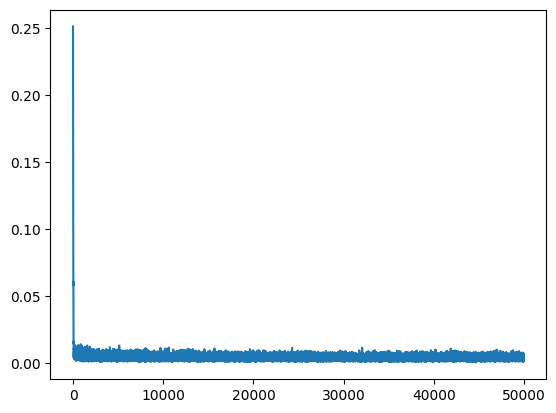

In [21]:
plt.plot(losses)

## Videos of trained model

In [41]:
# Generate circular video around the scene
gt_images = debug_images
# Rendered images are obtained by running trained nerf on each pose
rendered_images = []
for i in range(len(debug_tfrom_cam2worlds)):
    with torch.no_grad():
        rgb_predicted, _ = run_one_iter_of_tinynerf_2d(world_size, picture_size, picture_fov, focal_length,
                                                        torch.from_numpy(debug_tfrom_cam2worlds[i]).to(device), near_thresh,
                                                        far_thresh, depth_samples_per_ray,
                                                        get_minibatches, model, chunksize)
        rendered_images.append(rgb_predicted.detach().cpu().numpy().reshape(1, -1, 3))

# Expand the 1D images to 2D by replicating the single row
rendered_images = [np.tile(img, (50, 1, 1)) for img in rendered_images]
gt_images = [np.tile(img, (50, 1, 1)) for img in gt_images]

# Convert expanded images to the format required by MoviePy (list of RGB arrays)
rendered_images = [(img * 255).astype(np.uint8) for img in rendered_images]
gt_images = [(img * 255).astype(np.uint8) for img in gt_images]

rendered_clip = ImageSequenceClip(rendered_images, fps=1)  
rendered_clip.write_videofile('nerf_circle.mp4', codec='libx264')

gt_clip = ImageSequenceClip(gt_images, fps=1)
gt_clip.write_videofile('gt_circle.mp4', codec='libx264')


Moviepy - Building video nerf_circle.mp4.
Moviepy - Writing video nerf_circle.mp4



Moviepy - Done !
Moviepy - video ready nerf_circle.mp4
Moviepy - Building video gt_circle.mp4.
Moviepy - Writing video gt_circle.mp4



Moviepy - Done !
Moviepy - video ready gt_circle.mp4


Moviepy - Building video nerf_zoom.mp4.
Moviepy - Writing video nerf_zoom.mp4



Moviepy - Done !
Moviepy - video ready nerf_zoom.mp4
Moviepy - Building video gt_zoom.mp4.
Moviepy - Writing video gt_zoom.mp4



Moviepy - Done !
Moviepy - video ready gt_zoom.mp4


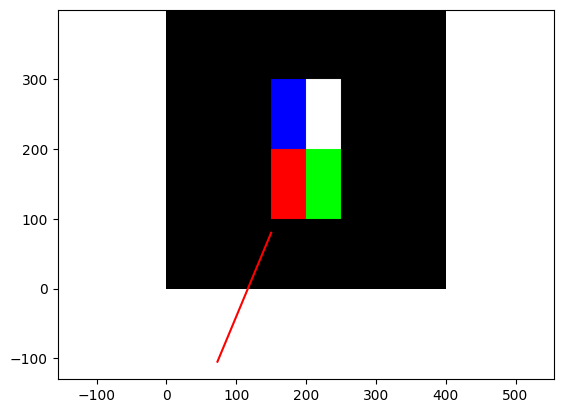

In [42]:
# Generate zoom out video starting from a given point
starting_point = (150, 80)
# Compute direction between starting point and center
video_direction = np.array(center) - np.array(starting_point)
# Normalize the direction
direction = video_direction / np.linalg.norm(video_direction)
depths = np.linspace(0, 200, 50)
# Generate 50 view points from starting point away from the center
video_viewpoints = [starting_point - depth * direction for depth in depths]
# For each viewpoint generate a 1D image and also render the image using the trained model and the camera matrix
video_gt_images = []
video_rendered_images = []
for i in range(len(video_viewpoints)):
    with torch.no_grad():
        # Generate 1D image
        gt_image, _, _, _, _ = camera.take_1d_picture(scene, center, video_viewpoints[i], focal_length, picture_size, picture_fov)
        # Render the image using the trained model
        rgb_predicted, _ = run_one_iter_of_tinynerf_2d(world_size, picture_size, picture_fov, focal_length,
                                                        torch.from_numpy(camera.compute_tform_cam2world_2d(video_viewpoints[i], center)).to(device), near_thresh,
                                                        far_thresh, depth_samples_per_ray,
                                                        get_minibatches, model, chunksize)
        video_gt_images.append(gt_image)
        video_rendered_images.append(rgb_predicted.detach().cpu().numpy().reshape(1, -1, 3))

video_gt_images = [np.tile(img, (50, 1, 1)) for img in video_gt_images]
video_rendered_images = [np.tile(img, (50, 1, 1)) for img in video_rendered_images]

video_gt_images = [(img * 255).astype(np.uint8) for img in video_gt_images]
video_rendered_images = [(img * 255).astype(np.uint8) for img in video_rendered_images]

video_rendered_clip = ImageSequenceClip(video_rendered_images, fps=1)
video_rendered_clip.write_videofile('nerf_zoom.mp4', codec='libx264')

video_gt_clip = ImageSequenceClip(video_gt_images, fps=1)
video_gt_clip.write_videofile('gt_zoom.mp4', codec='libx264')

plt.imshow(scene, origin="lower")
plt.axis('equal')
plt.plot(
    [v[0] for v in video_viewpoints],
    [v[1] for v in video_viewpoints],
    'r-'
)

## Debug

In [ ]:
# How to plot an image when stored in a matrix and interpreting it as matrix[i, j] = f(i,j)
# i should be the horizontal coordinate in the image
# j should be the vertical coordinate in the image
# The (0,0) should be the bottom left corner of the image

# Create a sample matrix with RGB values
# Each element is an (R, G, B) tuple
matrix = np.array([[[255, 0, 0], [0, 255, 0], [0, 0, 255]],   # Red, Green, Blue
                   [[255, 255, 0], [0, 255, 255], [255, 0, 255]], # Yellow, Cyan, Magenta
                   [[0, 0, 0], [128, 128, 128], [255, 255, 255]]]) # Black, Gray, White

# Plot the matrix as an image
plt.imshow(np.transpose(matrix, (1,0,2)), origin='lower')

# Add labels
plt.xlabel('X-axis')
plt.ylabel('Y-axis')

# Show the plot
plt.show()

In [ ]:
# Define the camera parameters
focal_length = 30  # Example focal length
picture_fov = 50  # Size of the focal plane (in world units)
picture_size = 300  # Number of pixels in the 1D picture

# Take a 1D photo of the scene
viewpoint = (200, 350)  # Example camera center
picture, image_plane_points_x, image_plane_points_y, tform_cam2world, _ = camera.take_1d_picture(scene, center, viewpoint, focal_length, picture_size, picture_fov, debug=True)

In [ ]:
# Draw a circle around the rectangle and take "pictures" from each point
debug_radius = 300
debug_theta = np.linspace(0, 2 * np.pi - (2* np.pi / 50), 50)
viewpoints_x = 200 + debug_radius * np.cos(debug_theta)
viewpoints_y = 200 + debug_radius * np.sin(debug_theta)
debug_images = []
debug_tform_cam2worlds = []
debug_near_thresh = 20
debug_far_thresh = 600
debug_depth_samples_per_ray = 32


for i in range(viewpoints_x.shape[0]):
    v_x = viewpoints_x[i]
    v_y = viewpoints_y[i]

    debug_image, x, y, debug_tform_cam2world, _ = camera.take_1d_picture(scene, center, (v_x, v_y), focal_length, picture_size, picture_fov)
    debug_images.append(debug_image)
    debug_tform_cam2worlds.append(debug_tform_cam2world)
    plt.figure(i)
    plt.imshow(scene)
    debug_tform_cam2world = torch.tensor(debug_tform_cam2world).to(device)

    ray_origins, ray_directions = get_ray_bundle_2d(picture_size, picture_fov, focal_length, debug_tform_cam2world)
    # plt.plot(ray_origins[:, 0], ray_origins[:, 1], 'ro')
    # # Plot ray directions as vectors
    # for j in range(ray_directions.shape[0]):
    #     plt.arrow(ray_origins[j, 0], ray_origins[j, 1], ray_directions[j, 0], ray_directions[j, 1], head_width=1, head_length=100, fc='red', ec='red')

    # Sample query points along each ray
    query_points, depth_values = compute_query_points_from_rays_2d(
        ray_origins, ray_directions, debug_near_thresh, debug_far_thresh, debug_depth_samples_per_ray
    )


    plt.plot(x, y, "b-")
    for i in range(query_points.shape[0]):
        plt.plot(query_points[i, :, 0].tolist(), query_points[i, :, 1].tolist(), "g.")
    plt.show()